# REGIONAL REGRASJONSANALYSE AV TOTALT TILSIG/MAGASINVOLUM
## Tipper/predikerer foregående ukes verdi
Dette scriptet utfører en estimering det totale tilsiget (ukjent+kjent) i hver av regionene: NO1-NO5 og SE1-SE4. Tippingen på tilsig og/eller magasin er basert på regresjon fra en mengde kjente serier for bla. tilsig og magasinvolum. Tippingen skrives til seriene regest% (søk i tidsserier). 

Beskrivelse av metoden:
1. Leser inn kjente serier for tilsig og/eller magasinvolum fra SMG, og henter ukesverdiene. Dette gjøres i egen celle slik at man kan kun trenger å lese inn en gang siden dette tar noen minutter.
2. Leser inn fasiten, og regner så ut korrelasjonen (R2) mellom faiten og inputseriene. Et antall serier som skal tas med videre velges så utifra "ant_kandidater" med høyeste korrelasjon med fasiten.
3. Kjøre regresjon så langt tilbake som vi har data (2015.06.08), og luker ut den høyeste p-verdien. Dette kjøres om og om igjen helt til den høyeste p-verdien er laveren enn "max_p".
4. Til slutt kjøres en regresjon på en kortere periode (reg_period) med utvalget av serier som har blitt gjort i steg 2 og 3. Resultatet fra denne regresjonen blir modellen som brukes til å estimere/tippe neste ukes verdi.
5. Scriptet gjør 10 slike tippinger, 10 uker tilbake i tid, for hver kjøring. 

Tuning av regresjonen utføres ved å spesifisere ant_kandidater, max_p og reg_period, som når man er fornøyd kan oppdateres i default_input_variables. For at dette skal bli brukt i autojobben, må man ta kontakt med Sarah, slik at dette kan legges inn i PyCharm scriptet som utfører autojobben (tirsdag 06:00 og 11:00).

Scriptet er laget av Sarah Gjermo, på bestilling fra Svein Farstad. Sist endret 06.05.2019.

## INNLESNING OG KLARGJØRING
Kjøres kun en gang!

In [2]:
from regression_modules import *

auto_input = {}
auto_input['tilsig'] = read_and_setup('tilsig')
auto_input['magasin'] = read_and_setup('magasin')

---------------------------------------------------------------
                        TILSIG                                 
---------------------------------------------------------------
Forventet innlesingstid er +/-180 sekunder.
Leser nå NO1..
Leser nå NO2..
Leser nå NO3..
Leser nå NO4..
Leser nå NO5..
Leser nå SE1..
Leser nå SE2..
Leser nå SE3..
Leser nå SE4..
Leser nå Tilsig kjente pr prisområde..
Leser nå Tilsig ukjente pr prisområde..
Leser nå BesteEstimat, Q_obse, Q_NFB..
Leser nå Tilsig basert på magasinendring pluss Kpp-prod, Del1..
Leser nå Del2..
Leser nå Del3..
Leser nå Del4..
Leser nå Del5..
Leser nå Tilsiget pr kraftverksområde: Del1..
Leser nå Del2..
Leser nå Del3..
Leser nå Del4..
Leser nå Del5..
Leser nå Del6..

Innlesning for tilsig tok totalt 263 sekunder. 

Mandag det tippes for (siste mandag ved tuning):  2019.06.24

-------------------Feil i kjente tilsig verdier--------------------
-22.459999999999997 /Skel-Slagnas.Bastus-D1050A3R-0108SV..SVF
-2.623751316368

## KJØRING
Her kan du velge å kjøre regresjonen for alle regioner, og for magasin og tilsig i ett f.eks, slik:

    var = ['Magasin','Tilsig']
    reg = ['NO1','NO2','NO3','NO4','NO5','SE1','SE2','SE3','SE4']
    for variable in var:
        for region in reg:
            show_result_input = make_estimate_and_write(variable, region, auto_input[variable])
            show_result(show_result_input)


Skriver estimerte verdier til:  RegEstimatMagNO1...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO1.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO1.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2015.08.24 til: 2019.06.24, satt til 200 uker.
Valgte 112 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99985
R2 mellom fasit og tipping: 0.99983

Fasit:
 2019-06-03 00:00:00+01:00    65.903118
2019-06-10 00:00:00+01:00    75.510256
2019-06-17 00:00:00+01:00    79.899999
2019-06-24 00:00:00

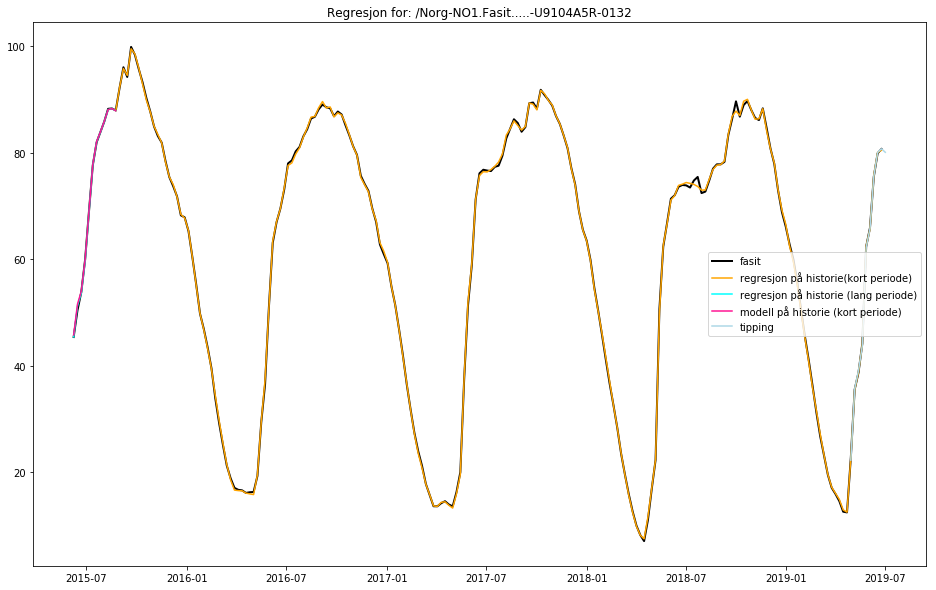

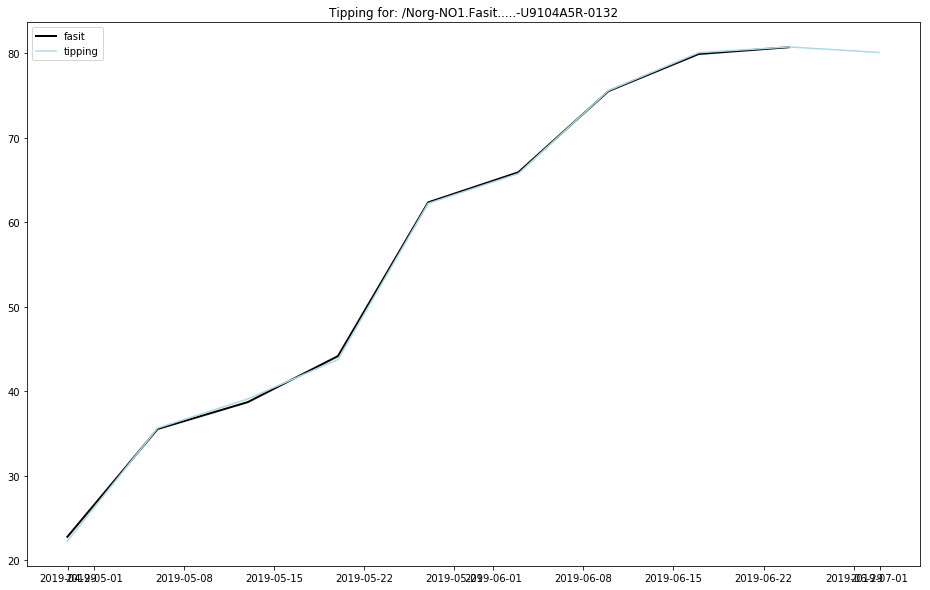

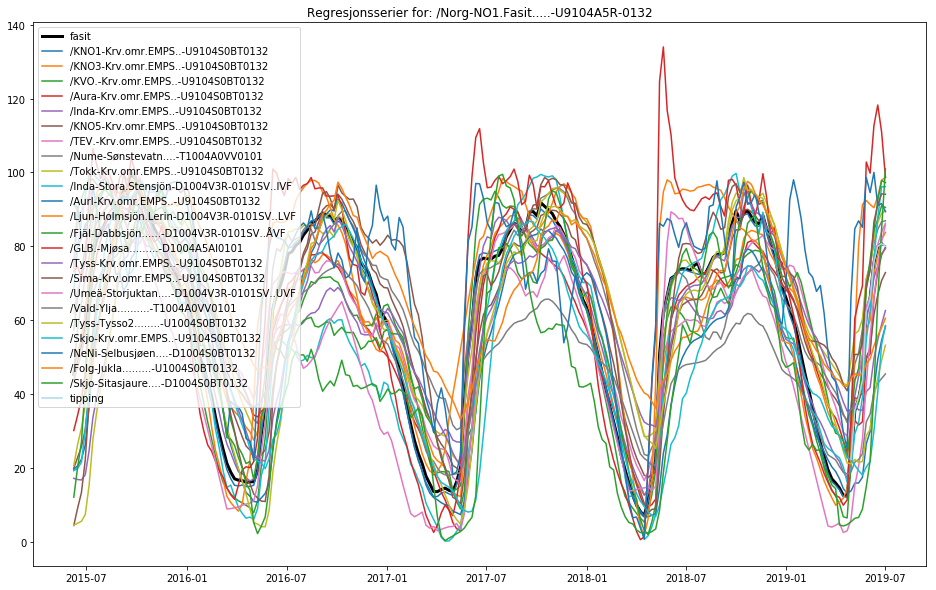


Skriver estimerte verdier til:  RegEstimatTilsigNO1-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO1.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No1.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2018.11.26 til: 2019.06.17, satt til 29 uker.
Valgte 22 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 3 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99903
R2 mellom fasit og tipping: 0.99248

Fasit:
 2019-05-27 00:00:00+01:00     618.613133
2019-06-03 00:00:00+01:00    1006.618333
2019-06-10 00:00:00+01:00     706.295471
2019-06-17 00:00:00

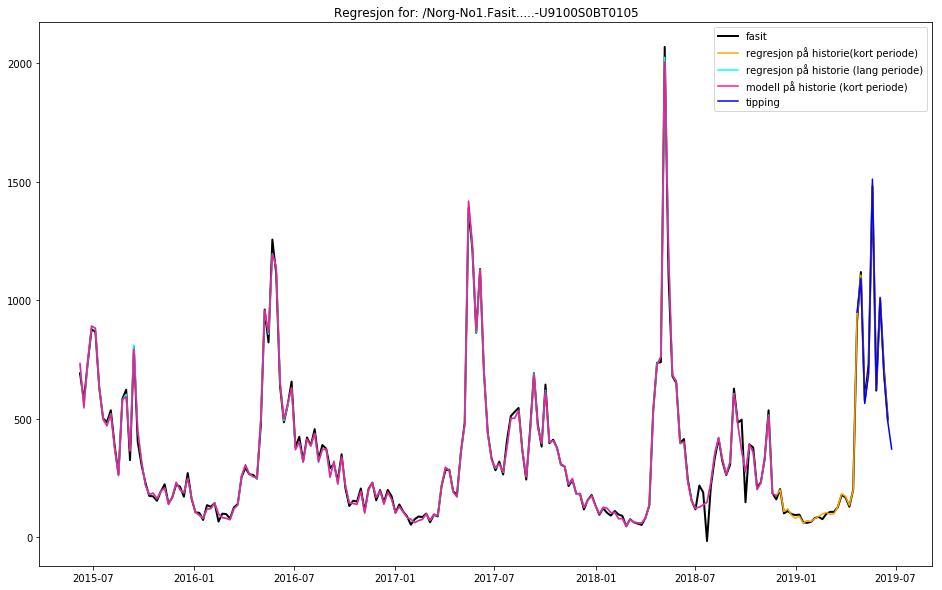

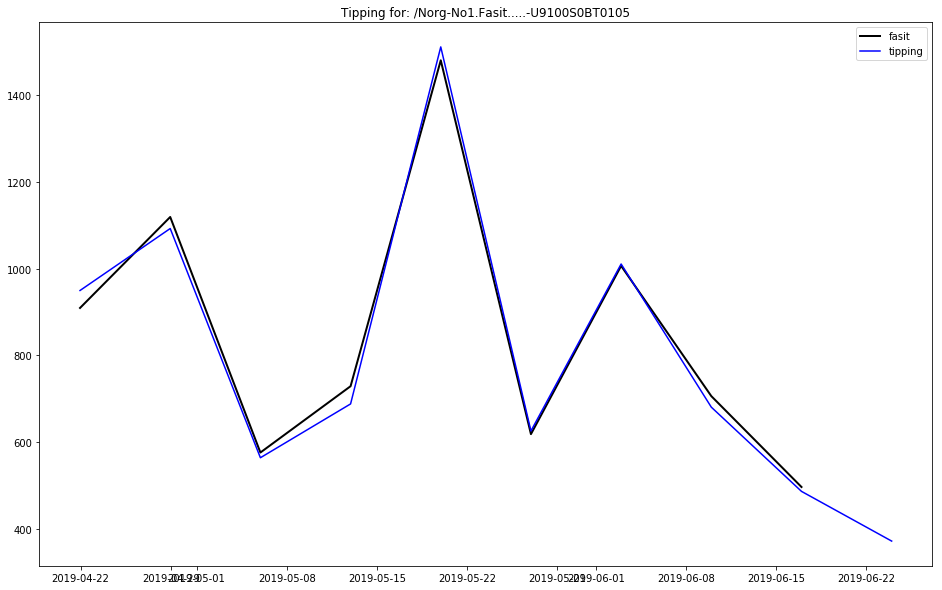

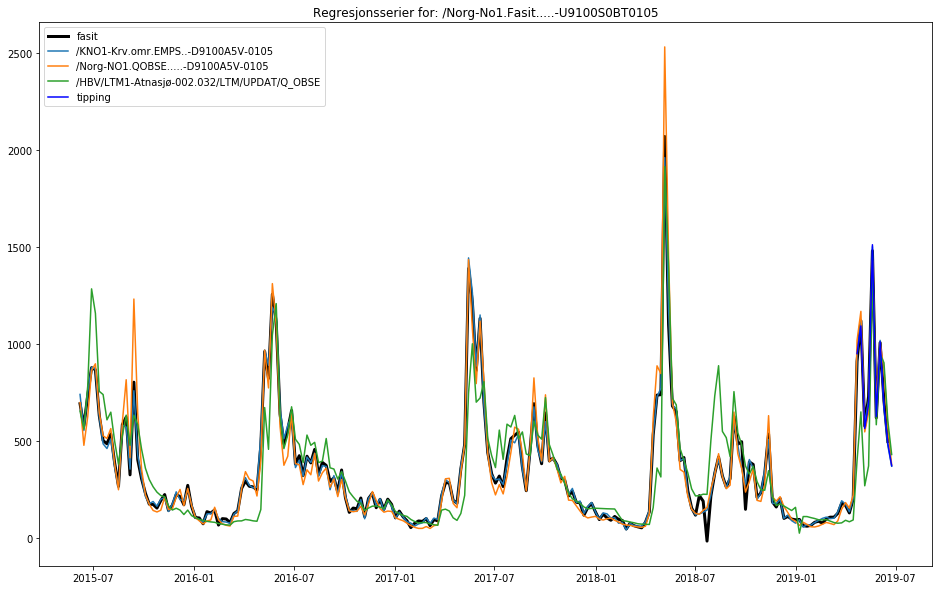


Skriver estimerte verdier til:  RegEstimatMagNO2...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO2.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO2.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.02.27 til: 2019.06.24, satt til 121 uker.
Valgte 69 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99996
R2 mellom fasit og tipping: 0.99978

Fasit:
 2019-06-03 00:00:00+01:00    60.910482
2019-06-10 00:00:00+01:00    65.912420
2019-06-17 00:00:00+01:00    69.500007
2019-06-24 00:00:00+

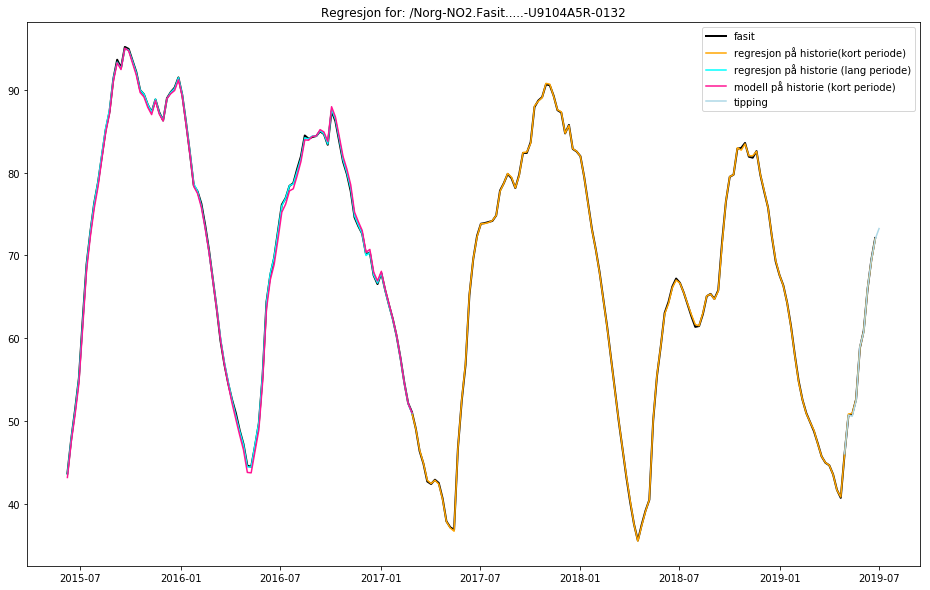

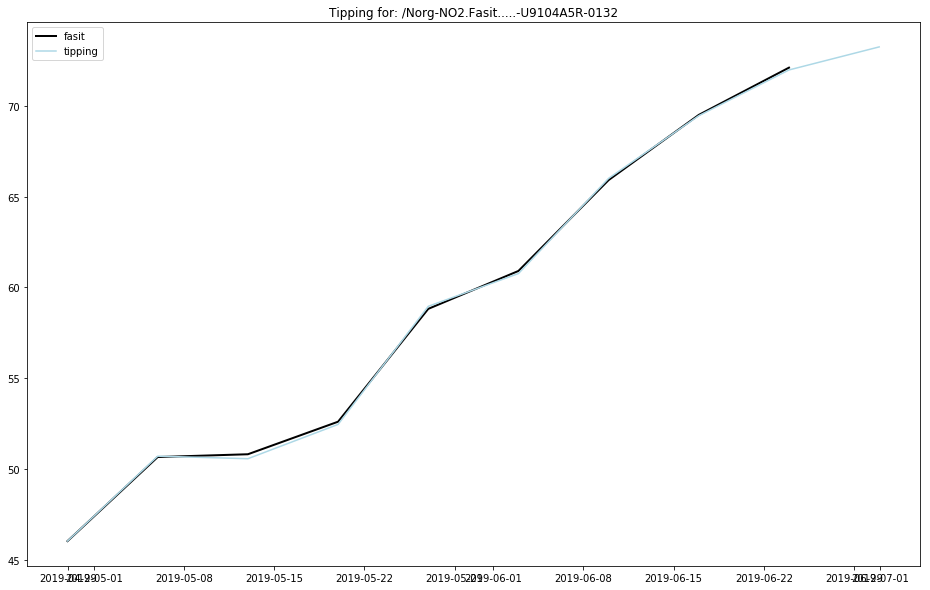

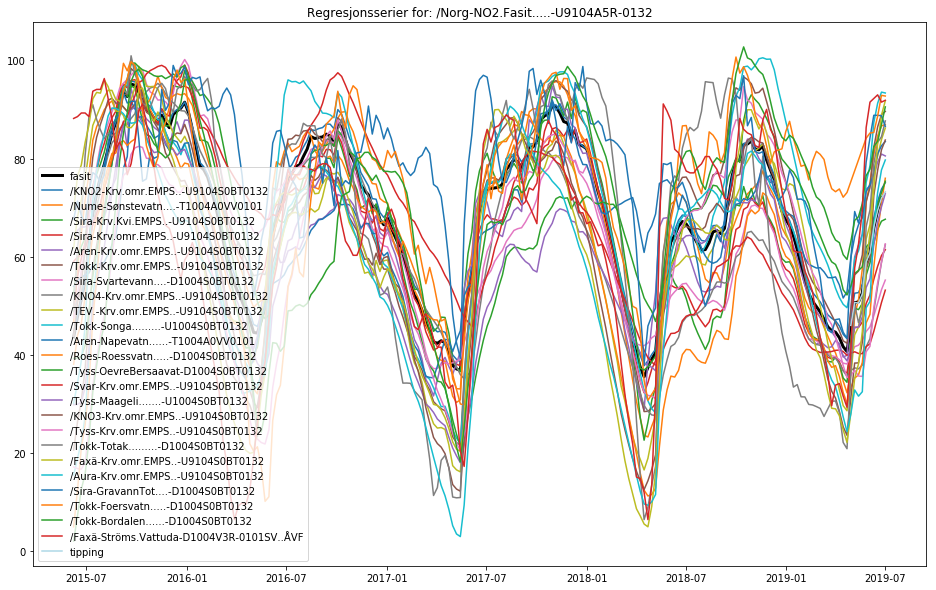


Skriver estimerte verdier til:  RegEstimatTilsigNO2-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO2.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No2.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.11.27 til: 2019.06.17, satt til 81 uker.
Valgte 23 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 10 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99751
R2 mellom fasit og tipping: 0.99377

Fasit:
 2019-05-27 00:00:00+01:00    1124.760188
2019-06-03 00:00:00+01:00    2156.222614
2019-06-10 00:00:00+01:00    1683.421658
2019-06-17 00:00:0

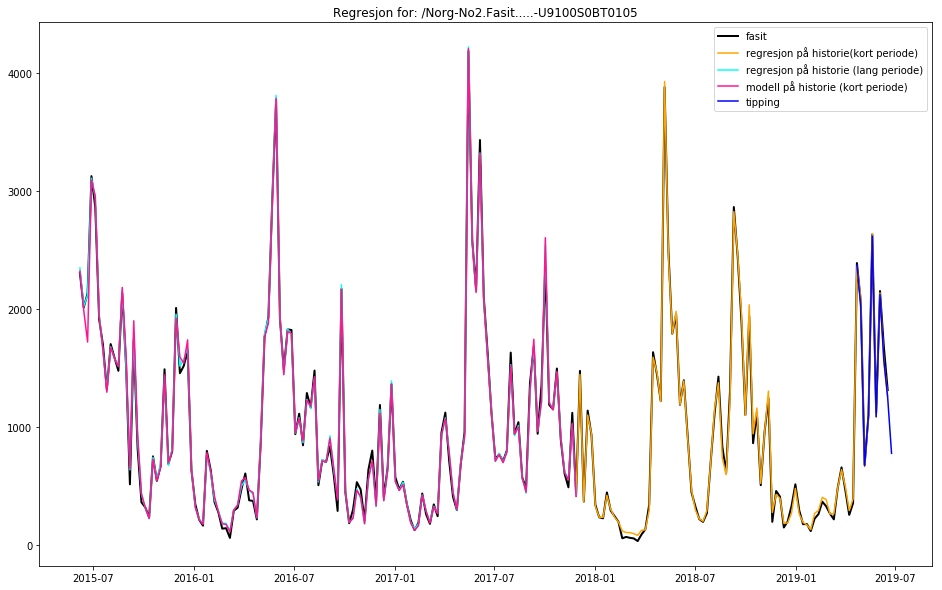

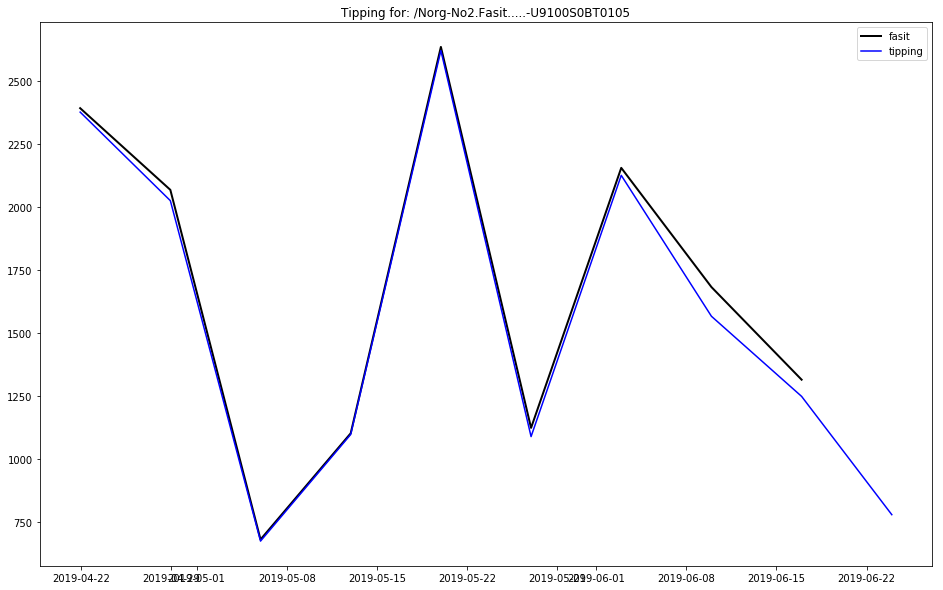

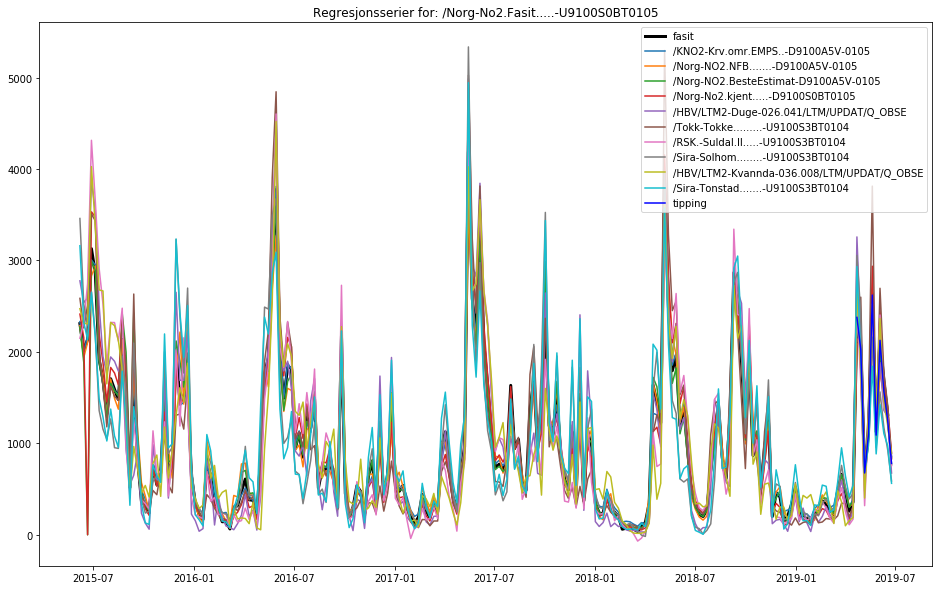


Skriver estimerte verdier til:  RegEstimatMagNO3...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO3.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO3.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2018.07.30 til: 2019.06.24, satt til 47 uker.
Valgte 129 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99998
R2 mellom fasit og tipping: 0.99975

Fasit:
 2019-06-03 00:00:00+01:00    56.137304
2019-06-10 00:00:00+01:00    67.481672
2019-06-17 00:00:00+01:00    73.399987
2019-06-24 00:00:00+

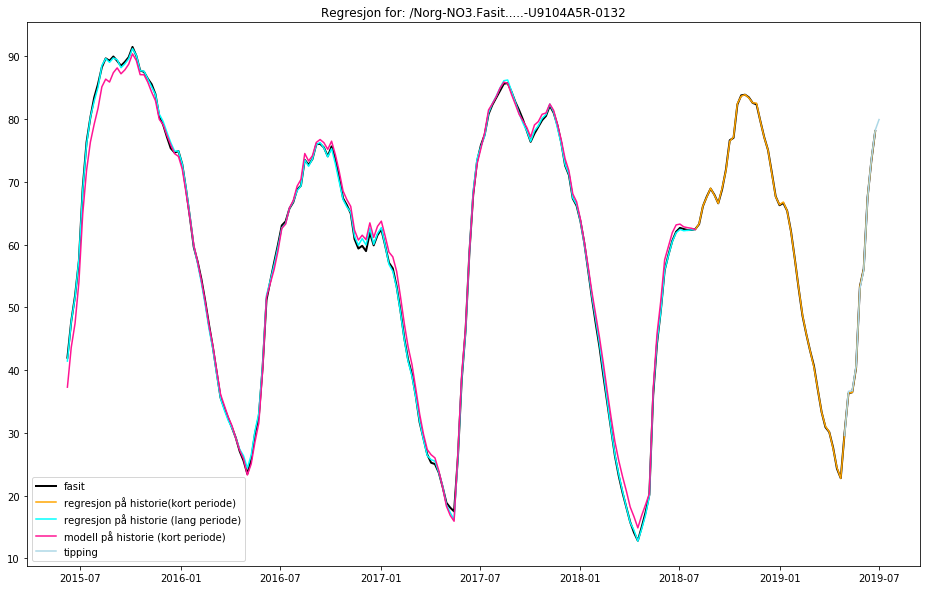

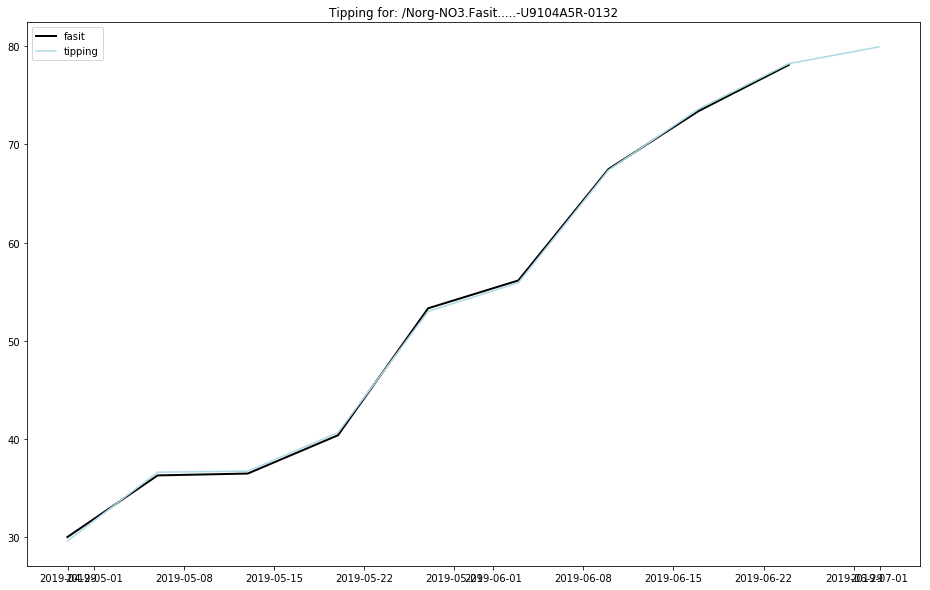

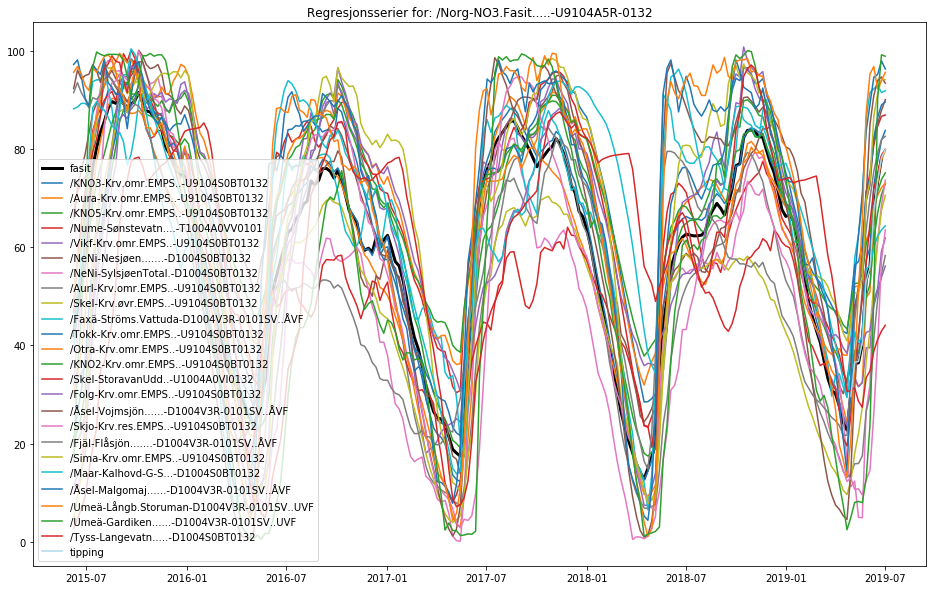


Skriver estimerte verdier til:  RegEstimatTilsigNO3-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO3.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No3.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.05.22 til: 2019.06.17, satt til 108 uker.
Valgte 190 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99848
R2 mellom fasit og tipping: 0.99280

Fasit:
 2019-05-27 00:00:00+01:00     564.794875
2019-06-03 00:00:00+01:00    1350.975264
2019-06-10 00:00:00+01:00     887.999336
2019-06-17 00:00

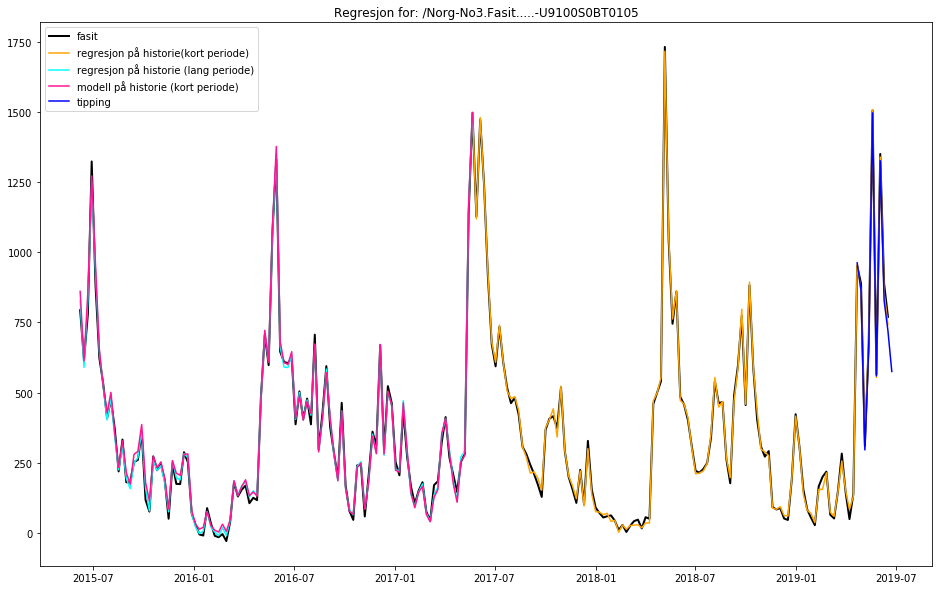

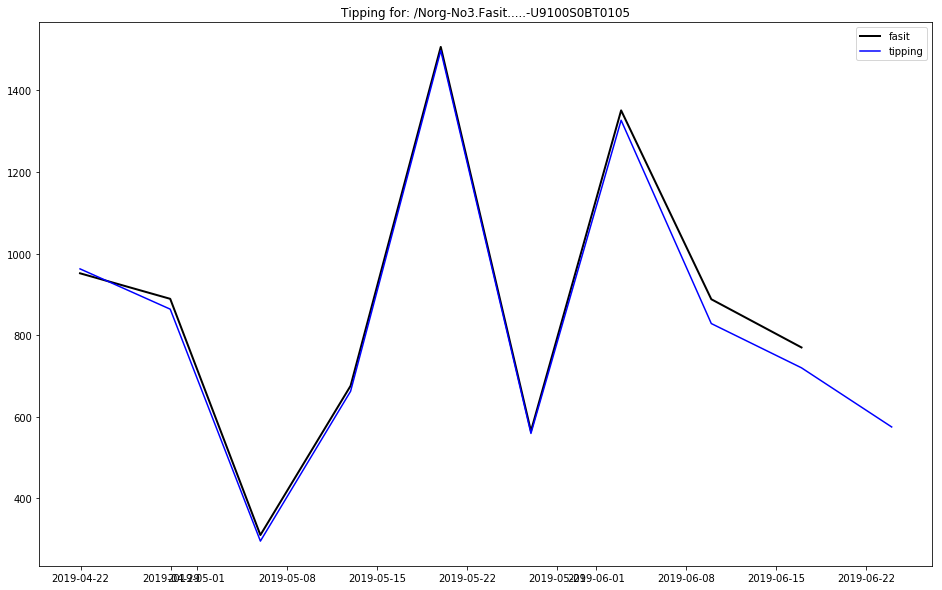

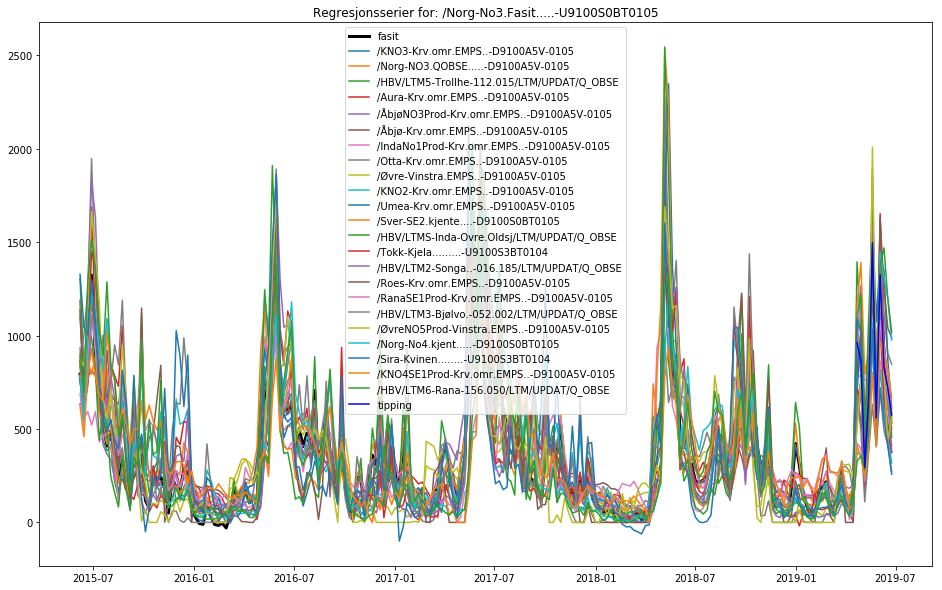


Skriver estimerte verdier til:  RegEstimatMagNO4...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO4.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO4.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.01.16 til: 2019.06.24, satt til 127 uker.
Valgte 96 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99991
R2 mellom fasit og tipping: 0.99872

Fasit:
 2019-06-03 00:00:00+01:00    40.943680
2019-06-10 00:00:00+01:00    47.931309
2019-06-17 00:00:00+01:00    53.900009
2019-06-24 00:00:00+

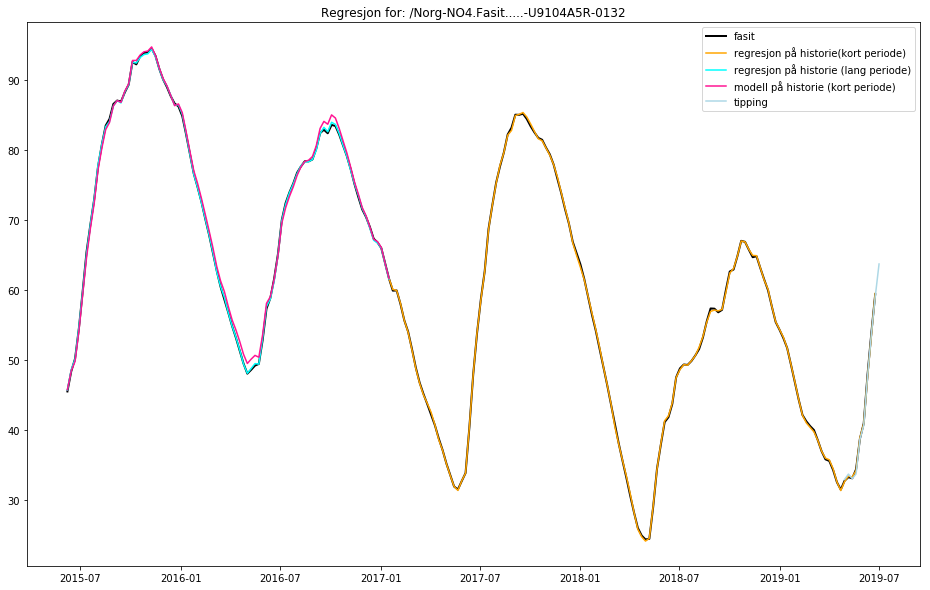

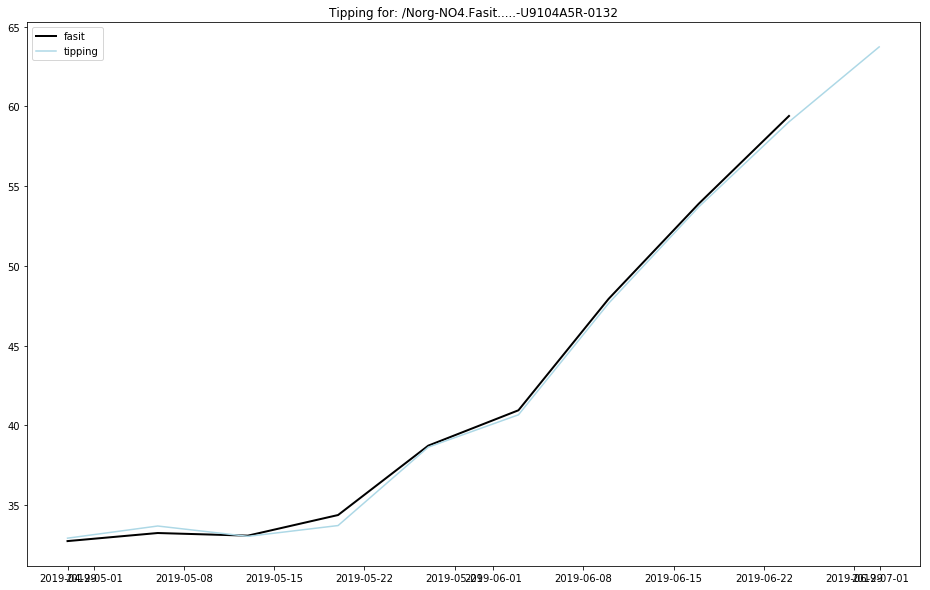

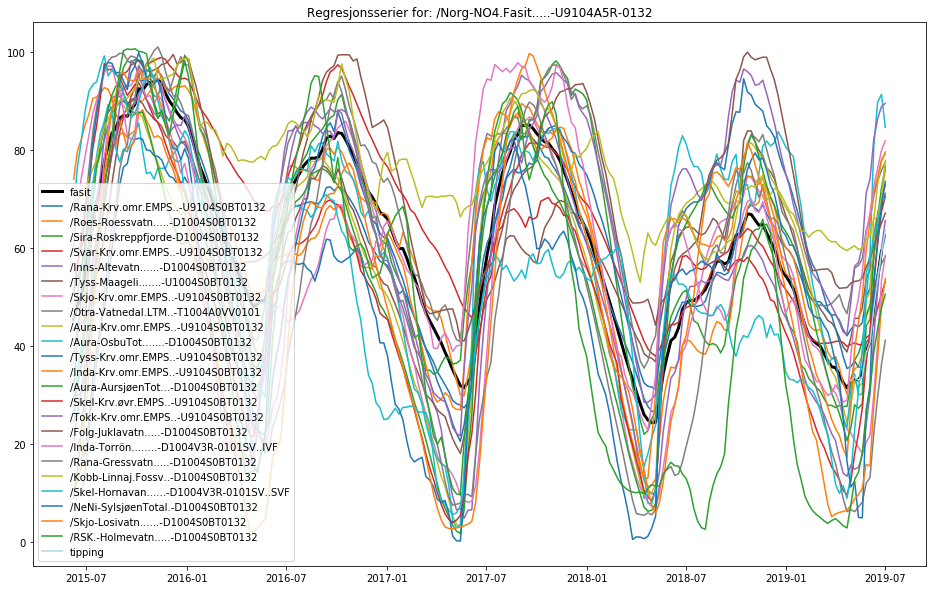


Skriver estimerte verdier til:  RegEstimatTilsigNO4-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO4.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No4.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2015.10.26 til: 2019.06.17, satt til 190 uker.
Valgte 164 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99720
R2 mellom fasit og tipping: 0.99476

Fasit:
 2019-05-27 00:00:00+01:00     777.850295
2019-06-03 00:00:00+01:00    1722.753047
2019-06-10 00:00:00+01:00    1547.765335
2019-06-17 00:00

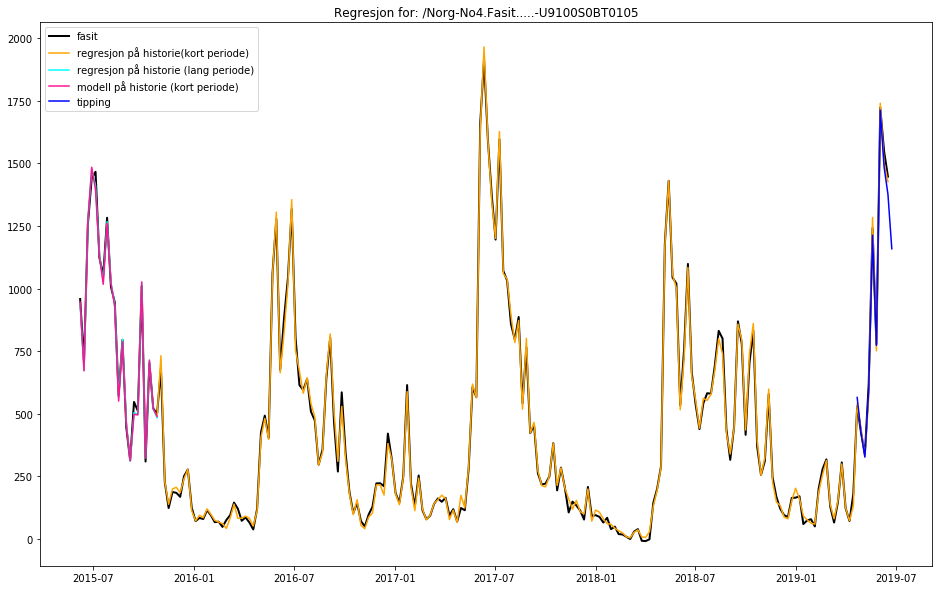

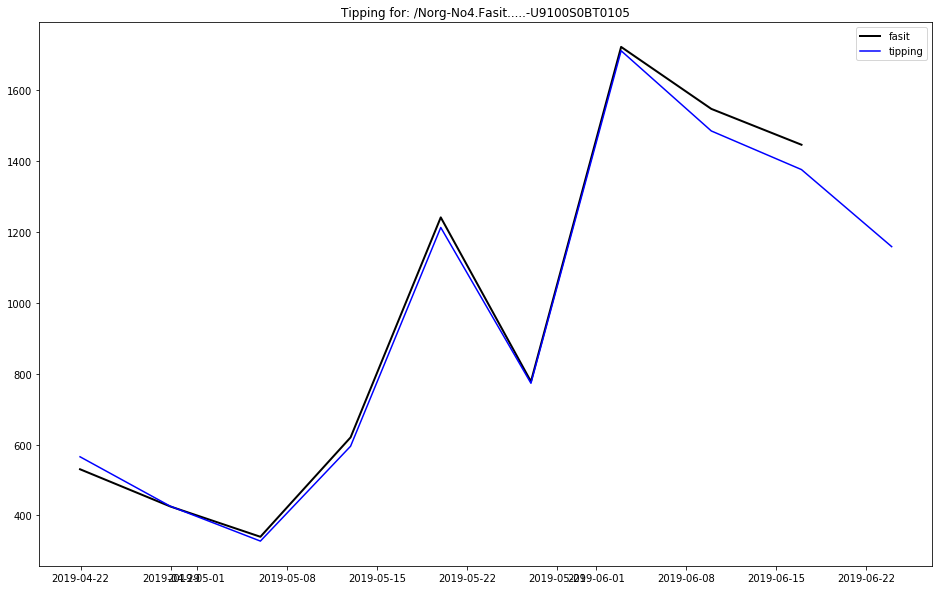

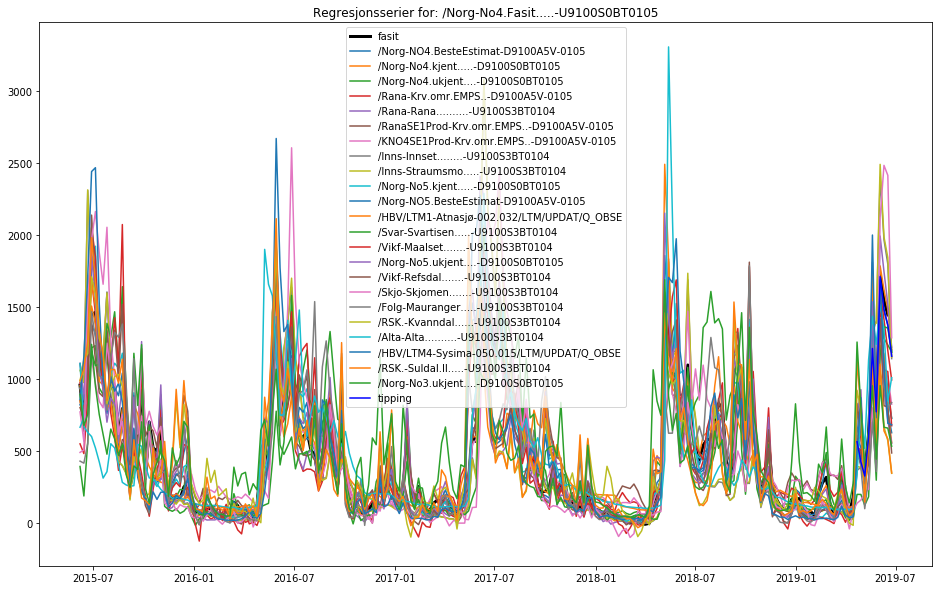


Skriver estimerte verdier til:  RegEstimatMagNO5...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO5.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO5.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.05.29 til: 2019.06.24, satt til 108 uker.
Valgte 133 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99993
R2 mellom fasit og tipping: 0.99964

Fasit:
 2019-06-03 00:00:00+01:00    43.531020
2019-06-10 00:00:00+01:00    52.826790
2019-06-17 00:00:00+01:00    58.500017
2019-06-24 00:00:00

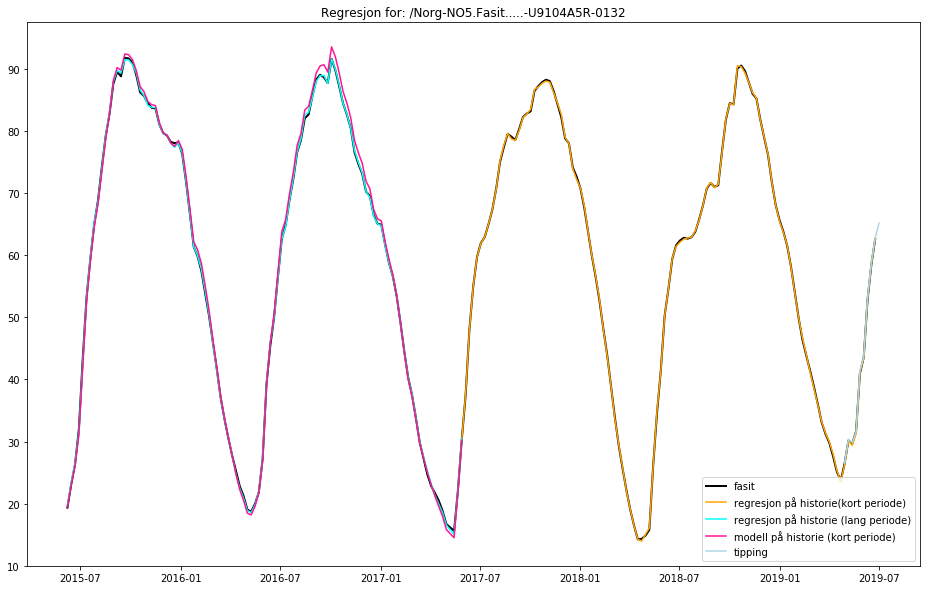

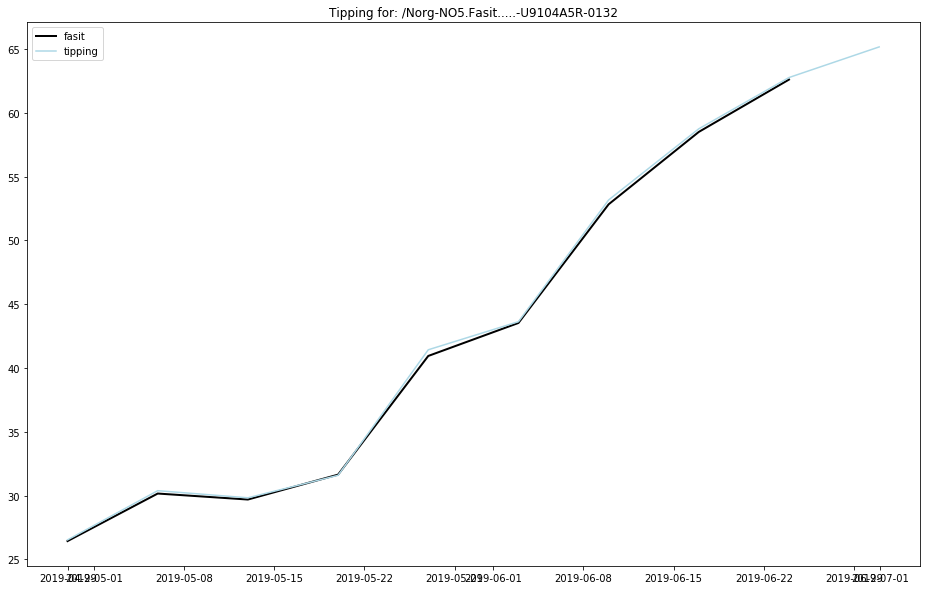

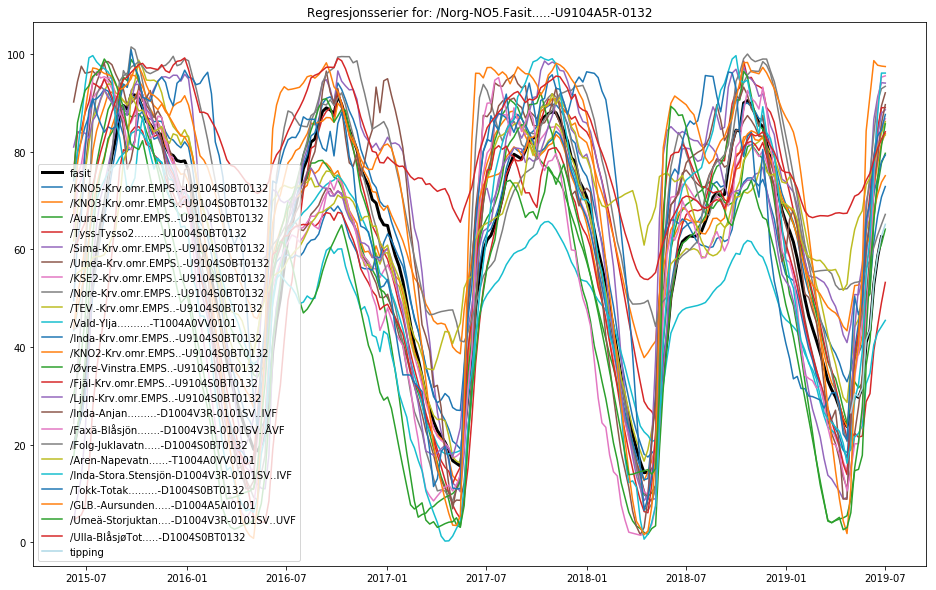


Skriver estimerte verdier til:  RegEstimatTilsigNO5-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO5.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No5.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.11.06 til: 2019.06.17, satt til 84 uker.
Valgte 110 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99833
R2 mellom fasit og tipping: 0.99826

Fasit:
 2019-05-27 00:00:00+01:00     837.785243
2019-06-03 00:00:00+01:00    2013.055943
2019-06-10 00:00:00+01:00    1427.929864
2019-06-17 00:00:

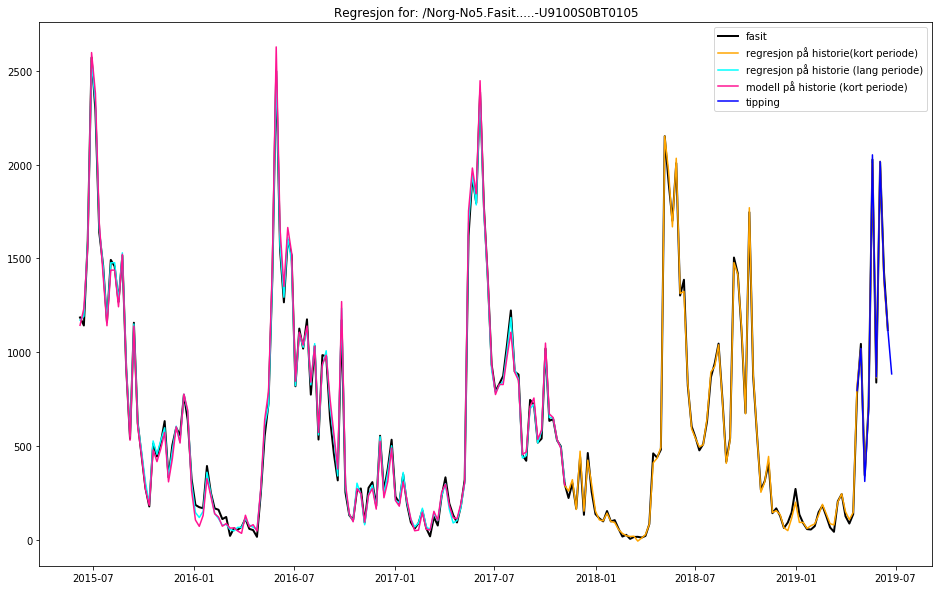

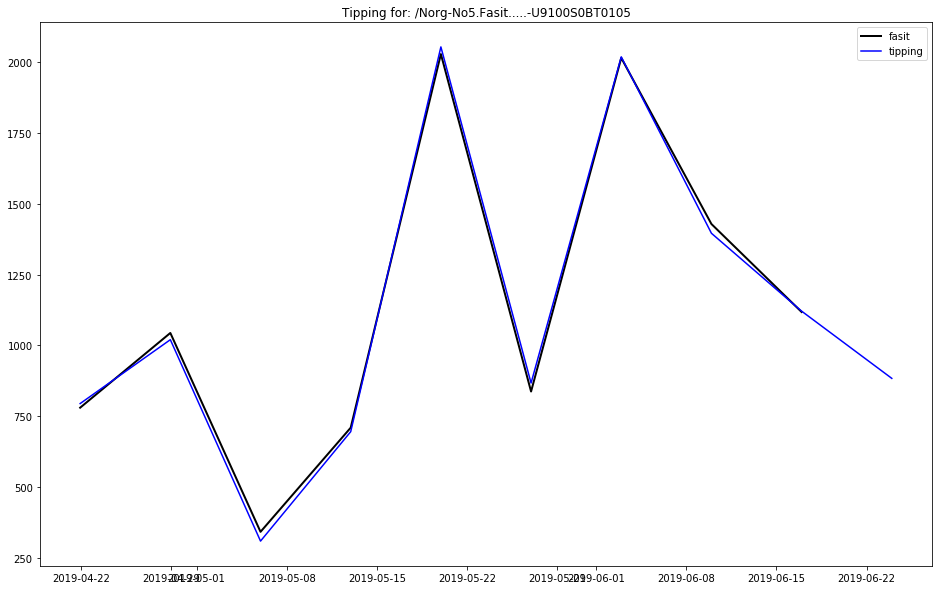

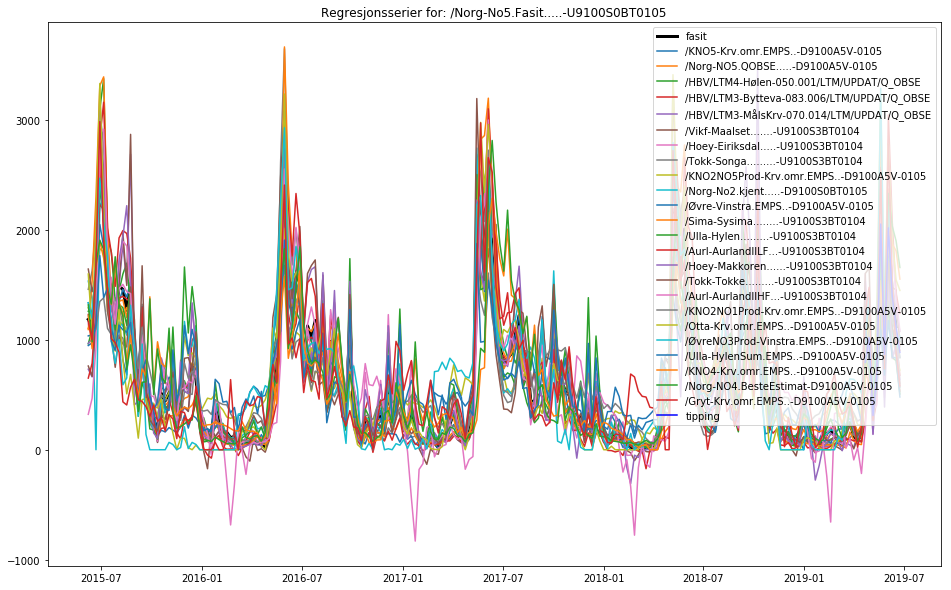


Skriver estimerte verdier til:  RegEstimatMagSE1...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE1.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE1.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2016.08.15 til: 2019.06.24, satt til 149 uker.
Valgte 104 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99950
R2 mellom fasit og tipping: 0.99568

Fasit:
 2019-06-03 00:00:00+01:00    30.4
2019-06-10 00:00:00+01:00    38.4
2019-06-17 00:00:00+01:00    49.0
2019-06-24 00:00:00+01:00    57.0


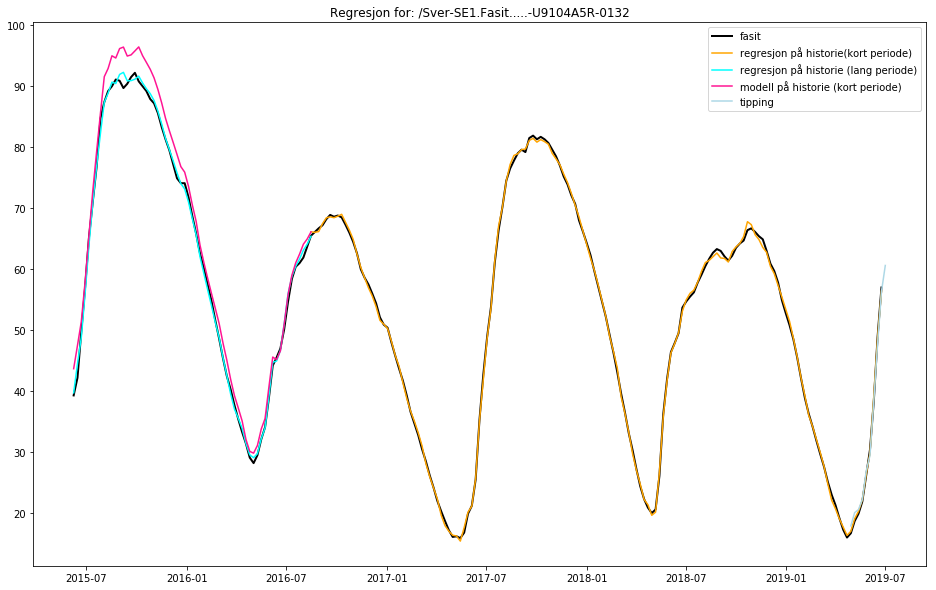

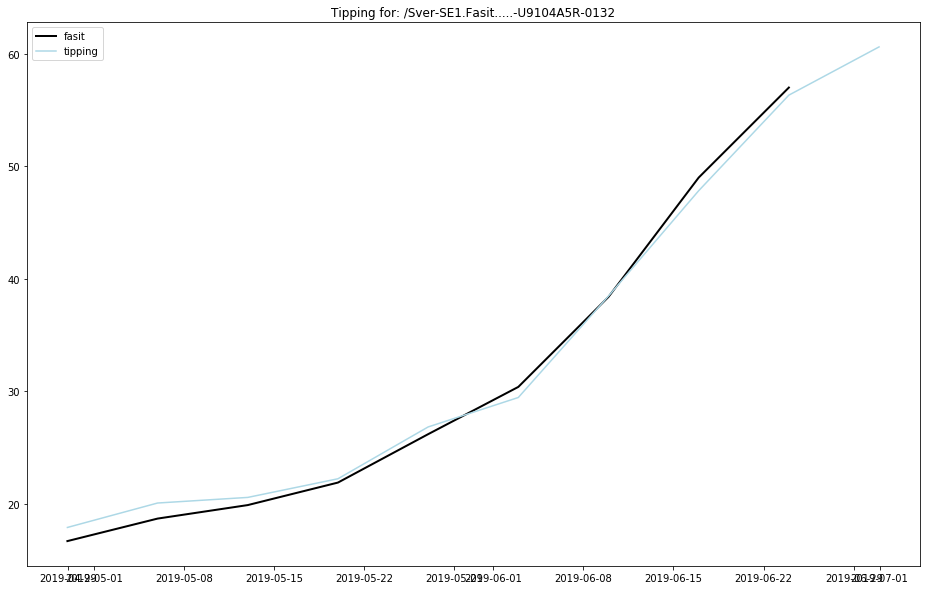

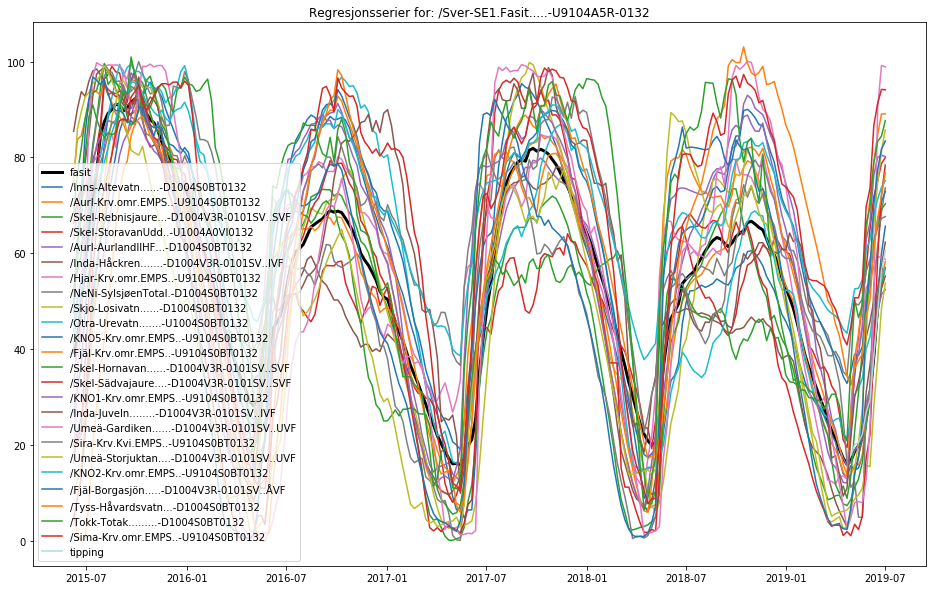


Skriver estimerte verdier til:  RegEstimatTilsigSE1-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE1.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se1.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.07.03 til: 2019.06.17, satt til 102 uker.
Valgte 194 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99273
R2 mellom fasit og tipping: 0.92595

Fasit:
 2019-05-27 00:00:00+01:00     814.70584
2019-06-03 00:00:00+01:00    1380.97260
2019-06-10 00:00:00+01:00    1754.74572
2019-06-17 00:00:00

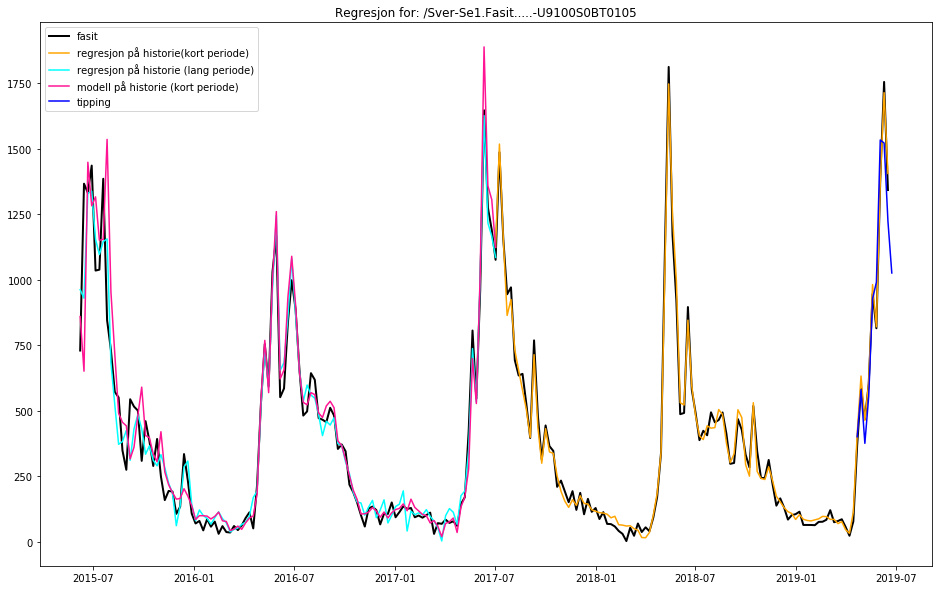

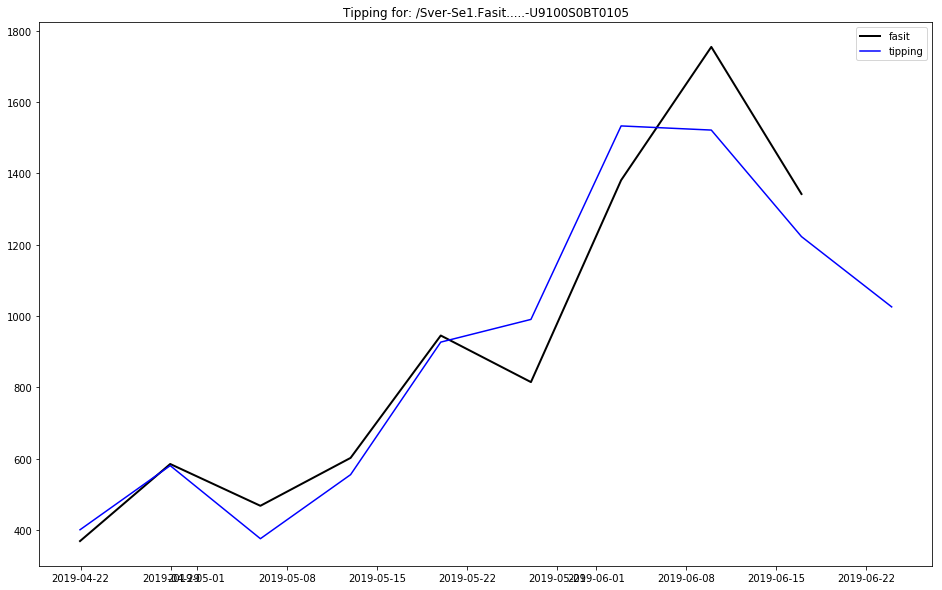

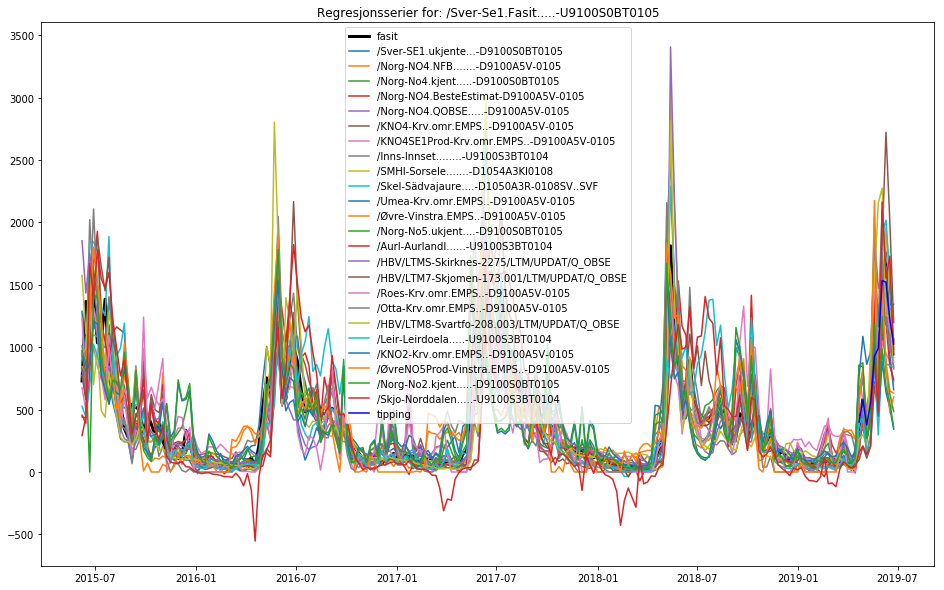


Skriver estimerte verdier til:  RegEstimatMagSE2...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE2.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE2.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2018.09.03 til: 2019.06.24, satt til 42 uker.
Valgte 70 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99998
R2 mellom fasit og tipping: 0.99969

Fasit:
 2019-06-03 00:00:00+01:00    66.2
2019-06-10 00:00:00+01:00    75.0
2019-06-17 00:00:00+01:00    80.8
2019-06-24 00:00:00+01:00    85.0
Fr

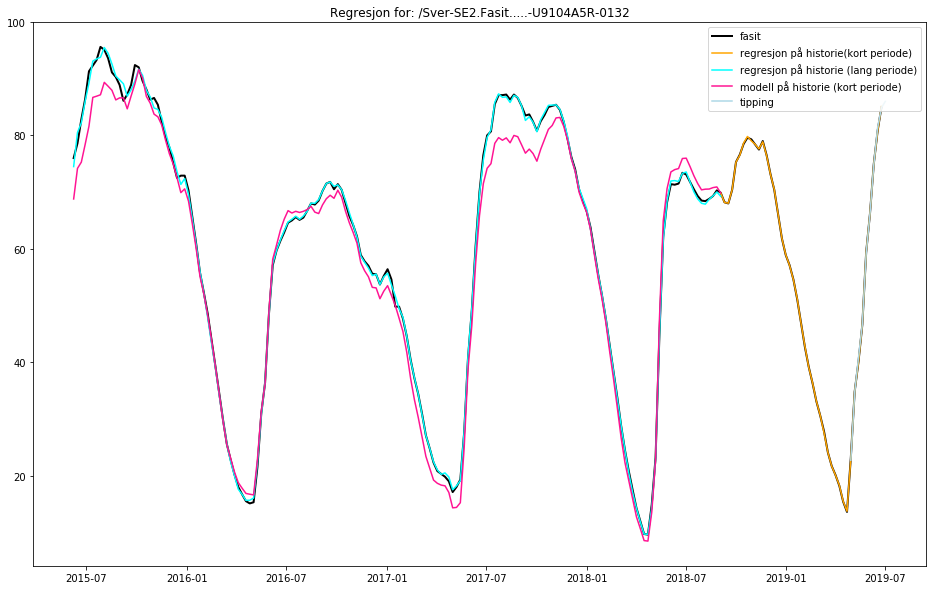

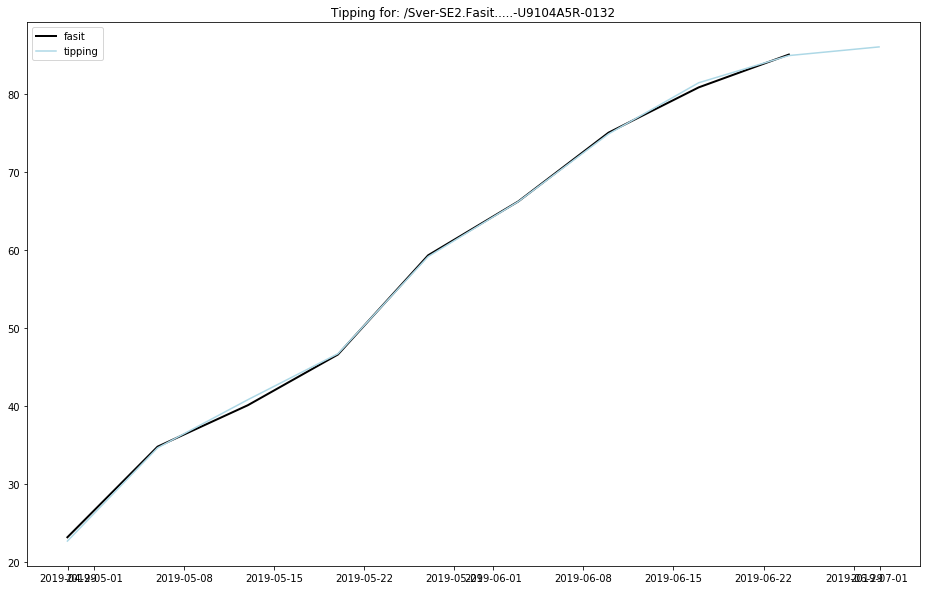

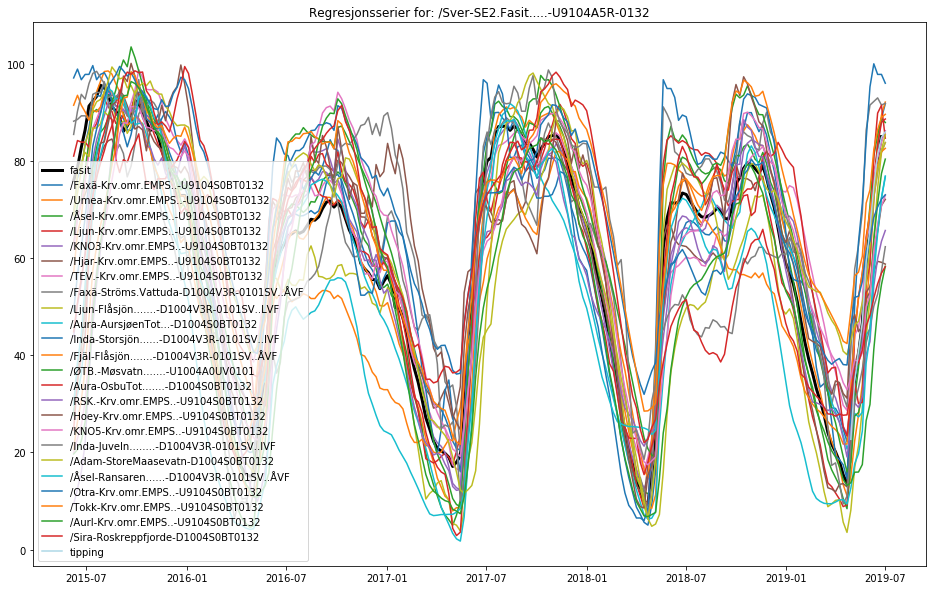


Skriver estimerte verdier til:  RegEstimatTilsigSE2-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE2.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se2.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.03.13 til: 2019.06.17, satt til 118 uker.
Valgte 36 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 7 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99867
R2 mellom fasit og tipping: 0.98836

Fasit:
 2019-05-27 00:00:00+01:00    1782.14487
2019-06-03 00:00:00+01:00    2149.19034
2019-06-10 00:00:00+01:00    1680.79934
2019-06-17 00:00:00+0

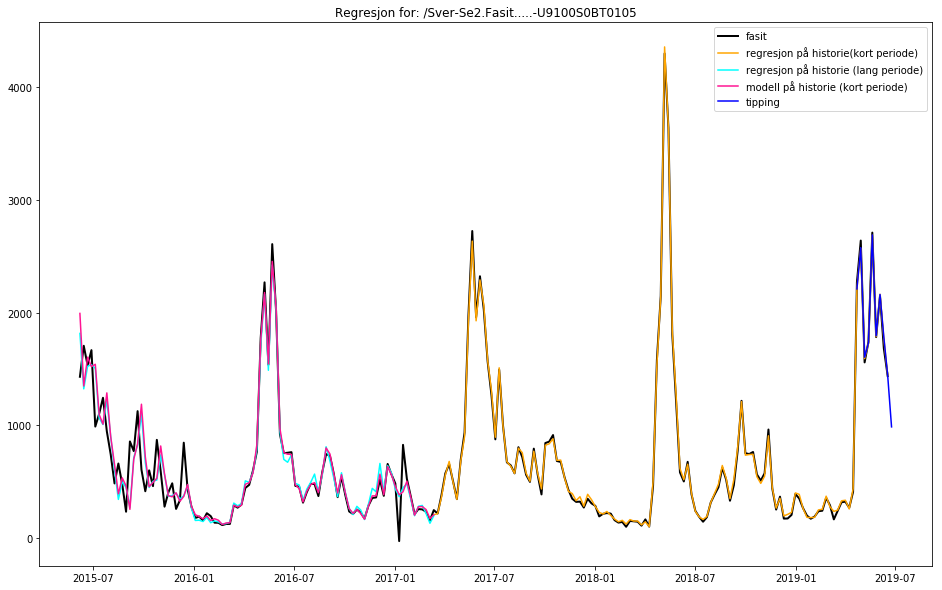

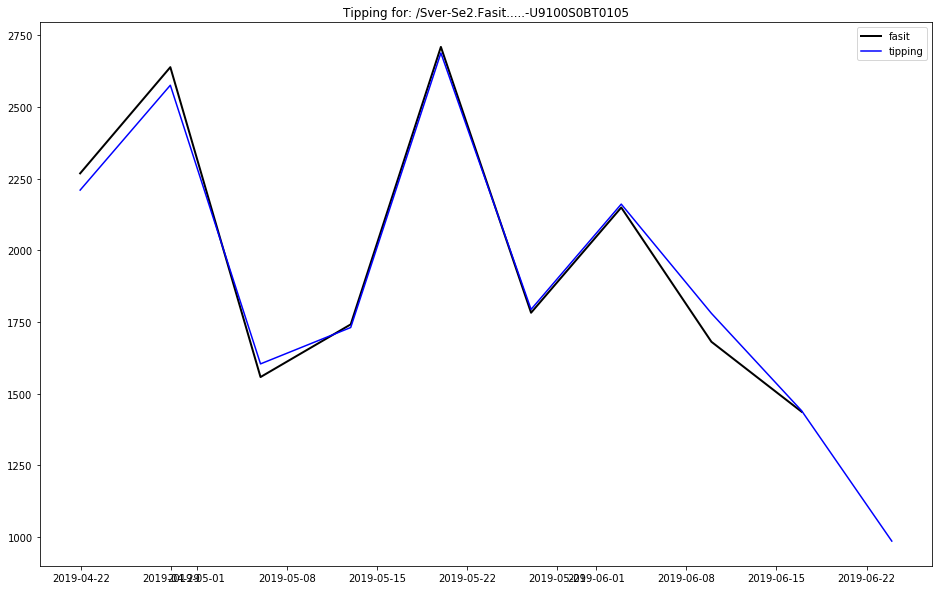

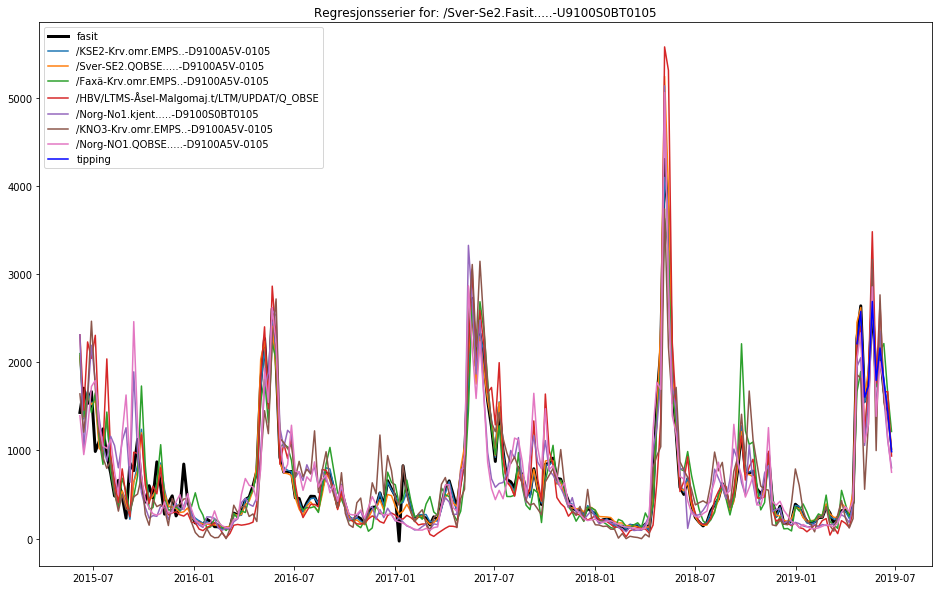


Skriver estimerte verdier til:  RegEstimatMagSE3...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE3.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE3.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2016.10.17 til: 2019.06.24, satt til 140 uker.
Valgte 119 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99510
R2 mellom fasit og tipping: 0.97917

Fasit:
 2019-06-03 00:00:00+01:00    72.9
2019-06-10 00:00:00+01:00    76.1
2019-06-17 00:00:00+01:00    78.1
2019-06-24 00:00:00+01:00    79.1


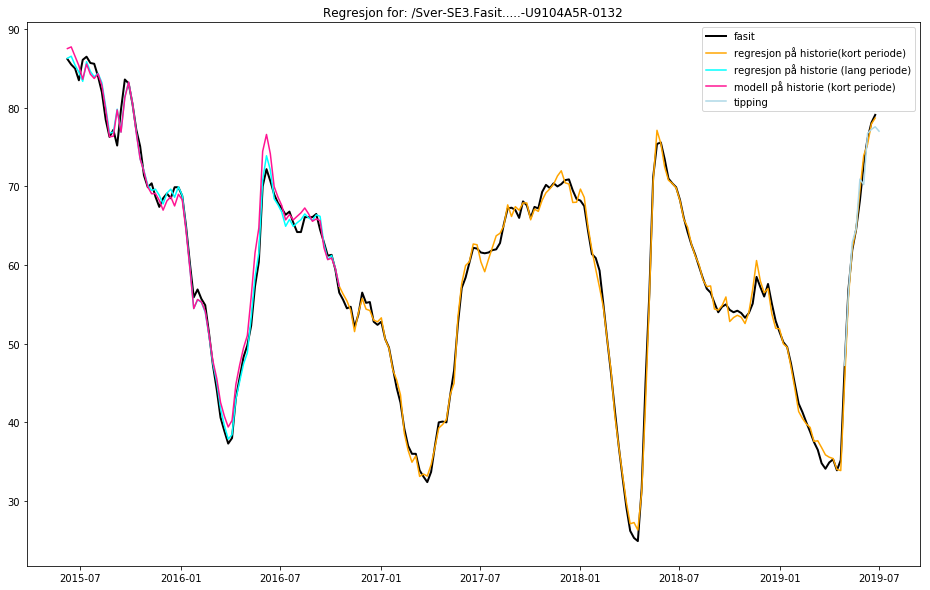

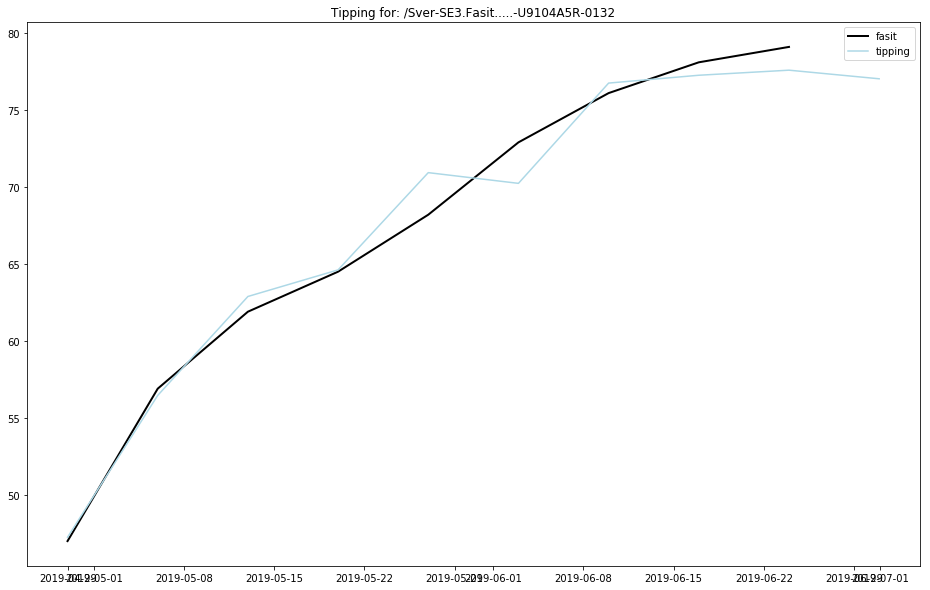

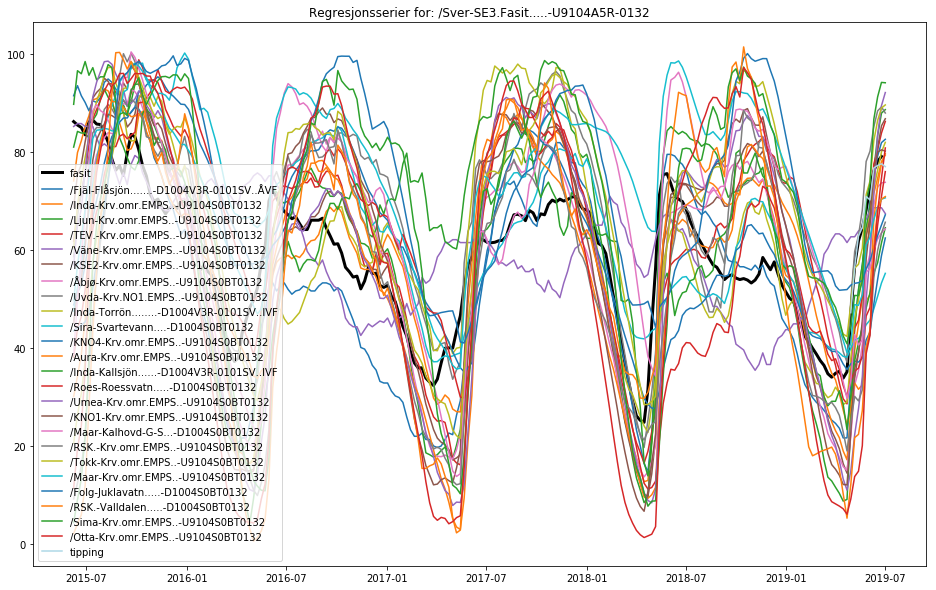


Skriver estimerte verdier til:  RegEstimatTilsigSE3-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE3.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se3.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2017.06.12 til: 2019.06.17, satt til 105 uker.
Valgte 174 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 19 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.97670
R2 mellom fasit og tipping: 0.90909

Fasit:
 2019-05-27 00:00:00+01:00    286.67769
2019-06-03 00:00:00+01:00    263.35294
2019-06-10 00:00:00+01:00    254.06810
2019-06-17 00:00:00+01

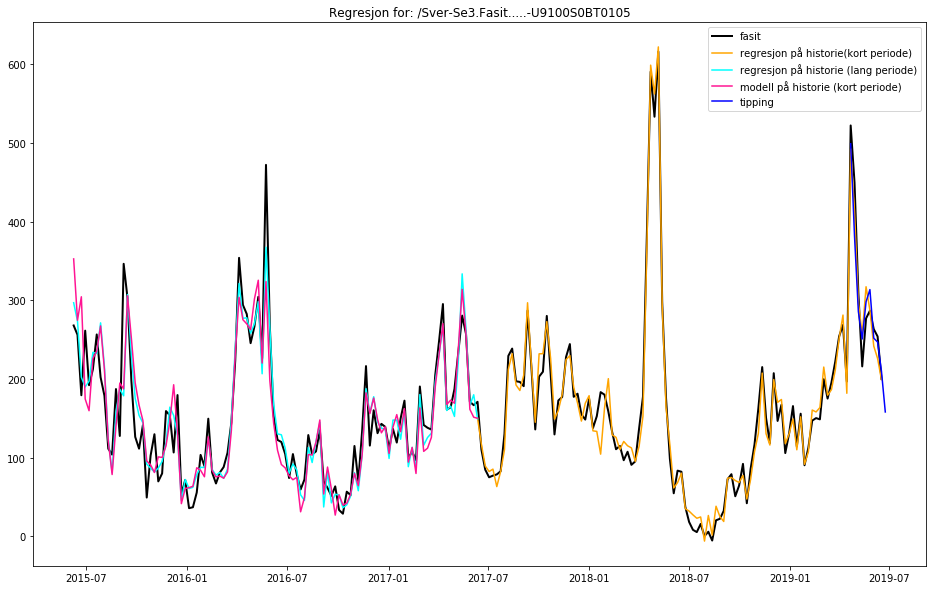

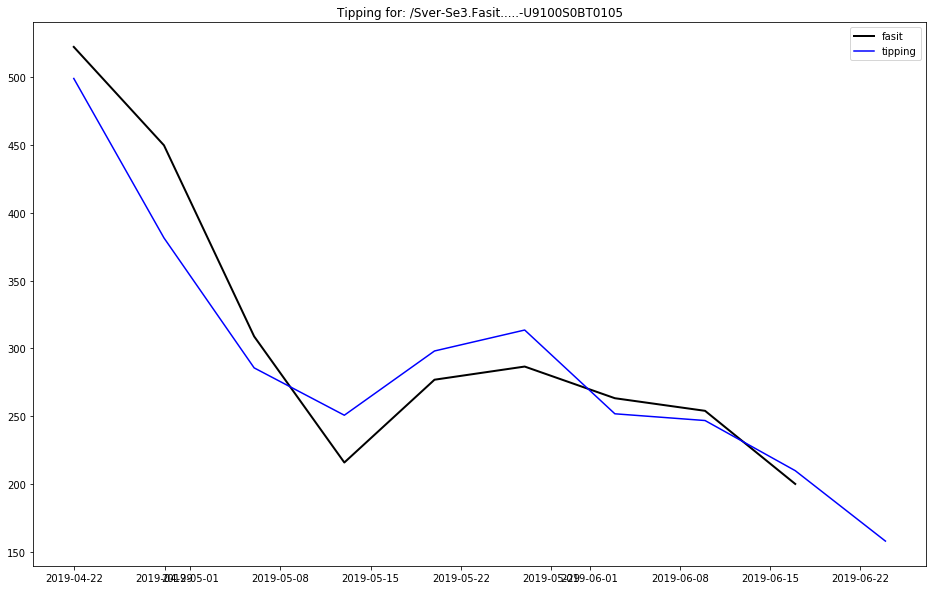

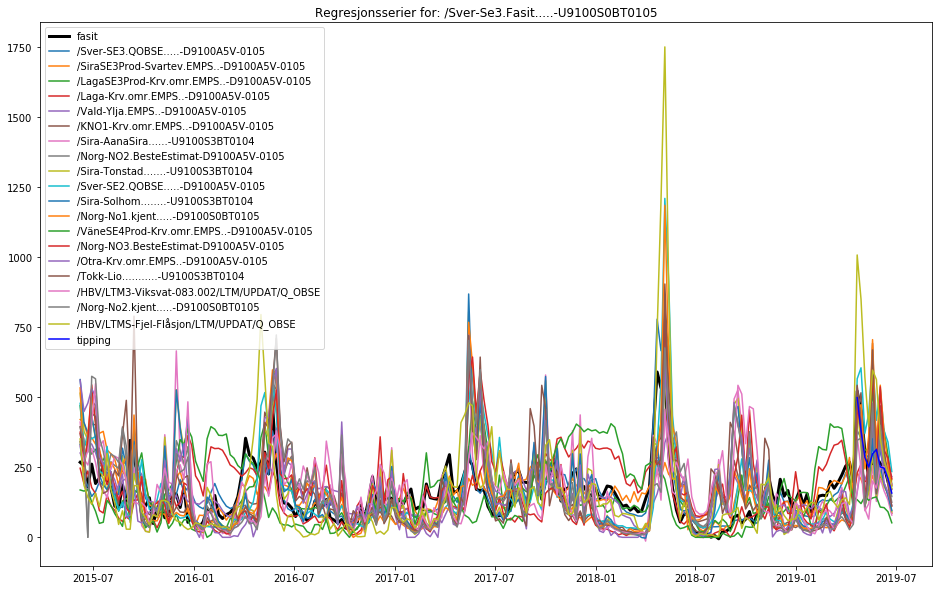


Skriver estimerte verdier til:  RegEstimatMagSE4...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE4.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE4.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.24.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2016.07.18 til: 2019.06.24, satt til 153 uker.
Valgte 97 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99821
R2 mellom fasit og tipping: 0.89000

Fasit:
 2019-06-03 00:00:00+01:00    58.5
2019-06-10 00:00:00+01:00    58.9
2019-06-17 00:00:00+01:00    60.3
2019-06-24 00:00:00+01:00    58.0
F

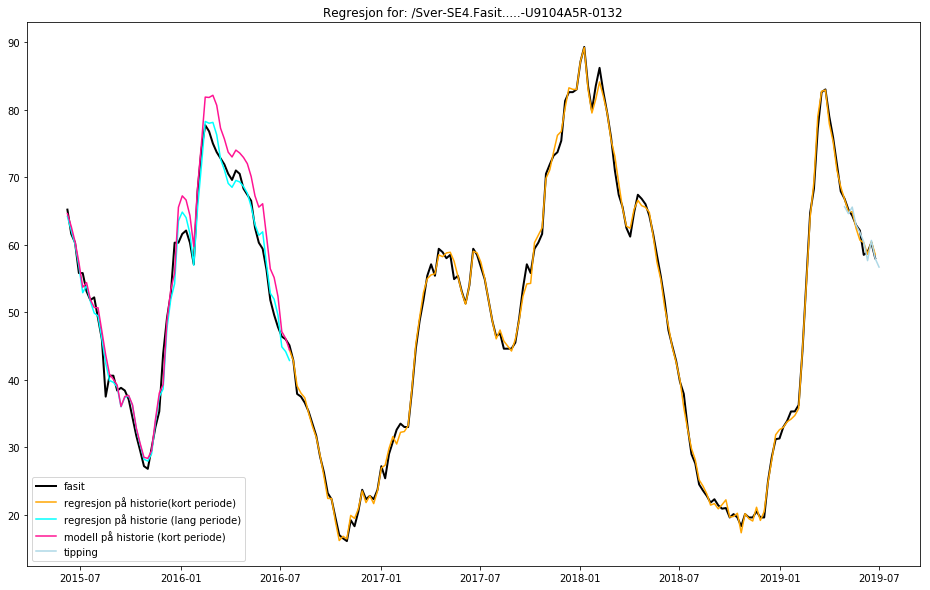

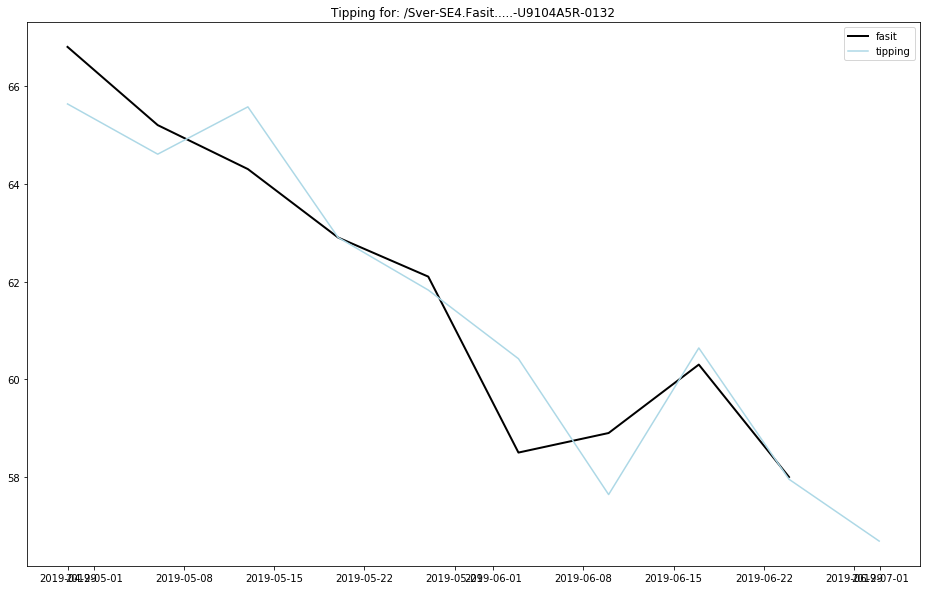

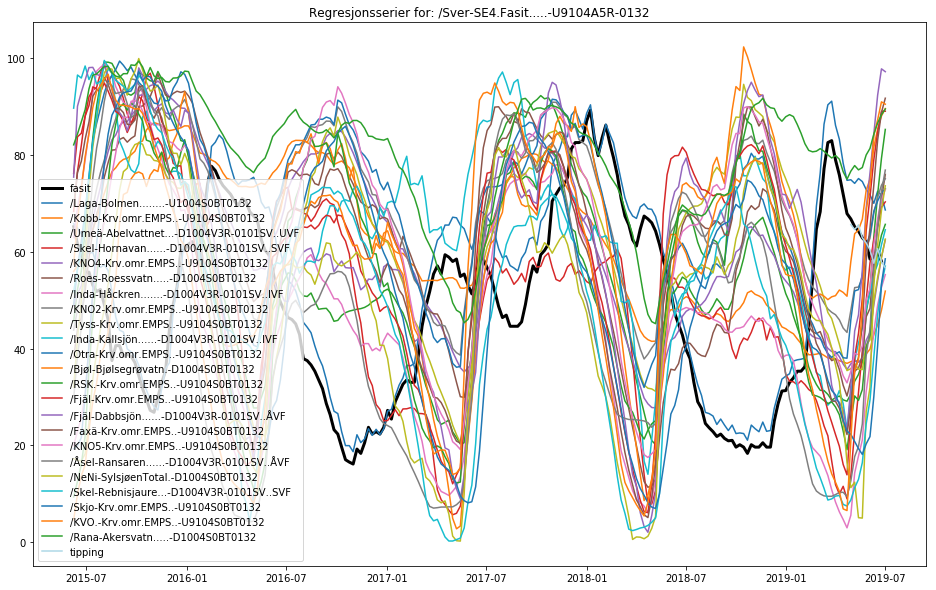


Skriver estimerte verdier til:  RegEstimatTilsigSE4-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE4.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se4.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.17.
Input variablene (reg_period og ant_kandidater) ble hentet fra:  input_variables_backup.txt
Regresjonsperiode brukt på modellen for siste tipping: 2015.07.27 til: 2019.06.17, satt til 203 uker.
Valgte 181 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.98148
R2 mellom fasit og tipping: 0.12990

Fasit:
 2019-05-27 00:00:00+01:00    14.368158
2019-06-03 00:00:00+01:00    20.882605
2019-06-10 00:00:00+01:00    24.698185
2019-06-17 00:00:00+01

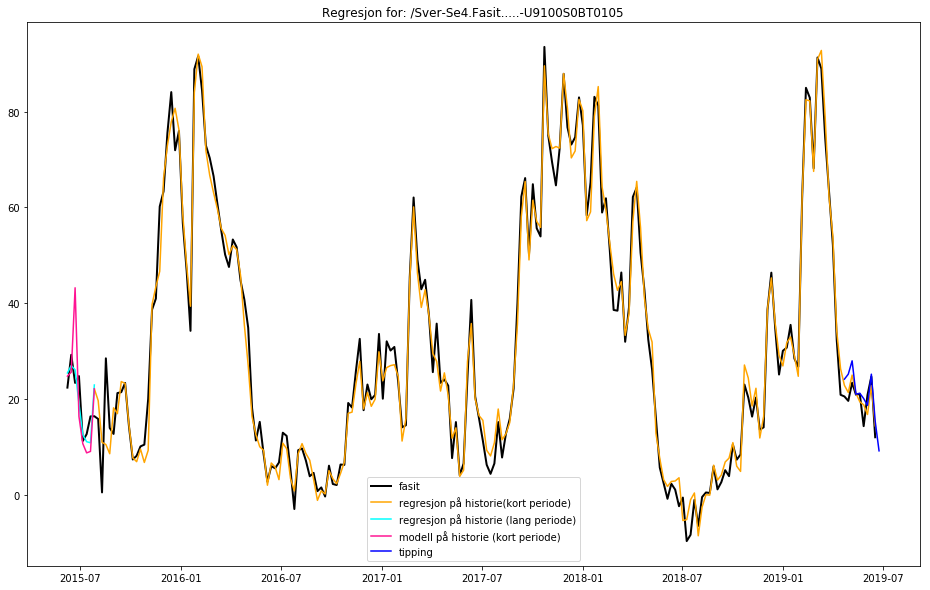

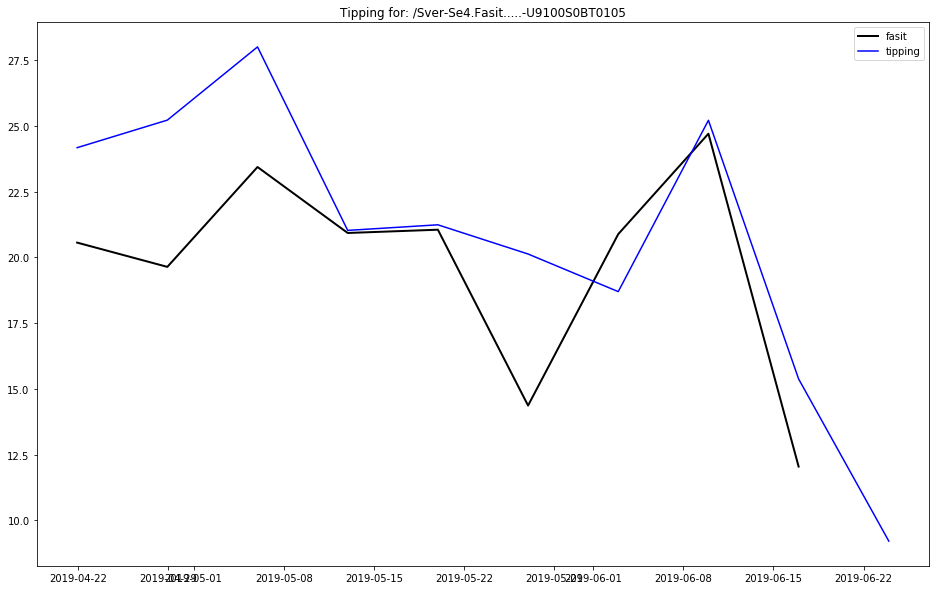

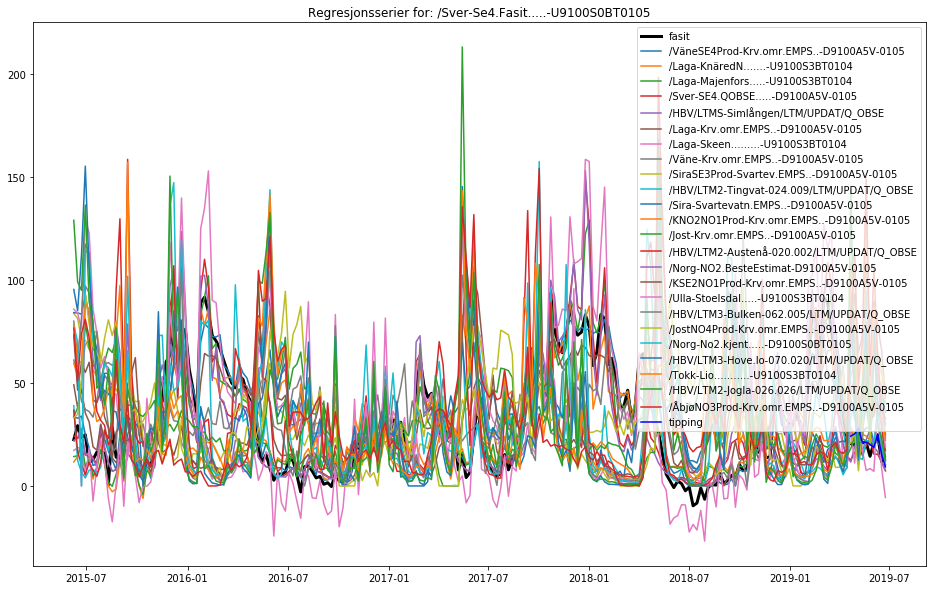

In [3]:
var = ['magasin','tilsig']
reg = ['NO1','NO2','NO3','NO4','NO5','SE1','SE2','SE3','SE4']
for region in reg:
    for variable in var:
        show_result_input = make_estimate_and_write(variable, region, auto_input[variable], backup=True)
        show_result_jupyter(show_result_input)